In [3]:
# used to supress display of warnings
import warnings

# os is used to provide a way of using operating system dependent functionality
# We use it for setting working folder
import os

# Pandas is used for data manipulation and analysis
import pandas as pd 

# Numpy is used for large, multi-dimensional arrays and matrices, along with mathematical operators on these arrays
import numpy as np

# Matplotlib is a data visualization library for 2D plots of arrays, built on NumPy arrays 
# and designed to work with the broader SciPy stack
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import pyplot

# Seaborn is based on matplotlib, which aids in drawing attractive and informative statistical graphics.
import seaborn as sns


## Scikit-learn features various classification, regression and clustering algorithms
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import average_precision_score, confusion_matrix, accuracy_score, classification_report, plot_confusion_matrix
from scipy.stats import zscore
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_recall_fscore_support
from sklearn.naive_bayes import GaussianNB

# DOMAIN :- Healthcare

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Import and warehouse data

## Task: Import all the given datasets and explore shape and size of each.

In [3]:
N_data = pd.read_csv('Part1 - Normal.csv')
N_data.head()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,38.505273,16.964297,35.112814,21.540976,127.632875,7.986683,Normal
1,54.920858,18.968430,51.601455,35.952428,125.846646,2.001642,Normal
2,44.362490,8.945435,46.902096,35.417055,129.220682,4.994195,Normal
3,48.318931,17.452121,48.000000,30.866809,128.980308,-0.910941,Normal
4,45.701789,10.659859,42.577846,35.041929,130.178314,-3.388910,Normal


In [4]:
N_data.shape

(100, 7)

In [5]:
N_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   P_incidence  100 non-null    float64
 1   P_tilt       100 non-null    float64
 2   L_angle      100 non-null    float64
 3   S_slope      100 non-null    float64
 4   P_radius     100 non-null    float64
 5   S_Degree     100 non-null    float64
 6   Class        100 non-null    object 
dtypes: float64(6), object(1)
memory usage: 5.6+ KB


In [6]:
H_data = pd.read_csv('Part1 - Type_H.csv')
H_data.head()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,Type_H
1,39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,Type_H
2,68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,Type_H
3,69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,Type_H
4,49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,Type_H


In [7]:
H_data.shape

(60, 7)

In [8]:
H_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60 entries, 0 to 59
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   P_incidence  60 non-null     float64
 1   P_tilt       60 non-null     float64
 2   L_angle      60 non-null     float64
 3   S_slope      60 non-null     float64
 4   P_radius     60 non-null     float64
 5   S_Degree     60 non-null     float64
 6   Class        60 non-null     object 
dtypes: float64(6), object(1)
memory usage: 3.4+ KB


In [9]:
S_data = pd.read_csv('Part1 - Type_S.csv')
S_data.head()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,74.377678,32.053104,78.772013,42.324573,143.560690,56.125906,Type_S
1,89.680567,32.704435,83.130732,56.976132,129.955476,92.027277,Type_S
2,44.529051,9.433234,52.000000,35.095817,134.711772,29.106575,Type_S
3,77.690577,21.380645,64.429442,56.309932,114.818751,26.931841,Type_S
4,76.147212,21.936186,82.961502,54.211027,123.932010,10.431972,Type_S


In [10]:
S_data.shape

(150, 7)

In [11]:
S_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   P_incidence  150 non-null    float64
 1   P_tilt       150 non-null    float64
 2   L_angle      150 non-null    float64
 3   S_slope      150 non-null    float64
 4   P_radius     150 non-null    float64
 5   S_Degree     150 non-null    float64
 6   Class        150 non-null    object 
dtypes: float64(6), object(1)
memory usage: 8.3+ KB


## Task: Merge all datasets onto one and explore final shape and size

In [12]:
All_data = pd.concat([N_data,H_data,S_data])

In [13]:
All_data

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,38.505273,16.964297,35.112814,21.540976,127.632875,7.986683,Normal
1,54.920858,18.968430,51.601455,35.952428,125.846646,2.001642,Normal
2,44.362490,8.945435,46.902096,35.417055,129.220682,4.994195,Normal
3,48.318931,17.452121,48.000000,30.866809,128.980308,-0.910941,Normal
4,45.701789,10.659859,42.577846,35.041929,130.178314,-3.388910,Normal
...,...,...,...,...,...,...,...
145,80.111572,33.942432,85.101608,46.169139,125.593624,100.292107,Type_S
146,95.480229,46.550053,59.000000,48.930176,96.683903,77.283072,Type_S
147,74.094731,18.823727,76.032156,55.271004,128.405731,73.388216,Type_S
148,87.679087,20.365613,93.822416,67.313473,120.944829,76.730629,Type_S


In [14]:
All_data.shape

(310, 7)

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data cleansing


## Task: Explore and if required correct the datatypes of each attribute
## Explore for null values in the attributes and if required drop or impute values

In [15]:
All_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 310 entries, 0 to 149
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   P_incidence  310 non-null    float64
 1   P_tilt       310 non-null    float64
 2   L_angle      310 non-null    float64
 3   S_slope      310 non-null    float64
 4   P_radius     310 non-null    float64
 5   S_Degree     310 non-null    float64
 6   Class        310 non-null    object 
dtypes: float64(6), object(1)
memory usage: 19.4+ KB


In [16]:
All_data['Class'] = All_data.Class.astype('category')

In [17]:
All_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 310 entries, 0 to 149
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   P_incidence  310 non-null    float64 
 1   P_tilt       310 non-null    float64 
 2   L_angle      310 non-null    float64 
 3   S_slope      310 non-null    float64 
 4   P_radius     310 non-null    float64 
 5   S_Degree     310 non-null    float64 
 6   Class        310 non-null    category
dtypes: category(1), float64(6)
memory usage: 17.5 KB


In [18]:
All_data.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
P_incidence,310.0,NaN,NaN,NaN,60.496653,17.23652,26.147921,46.430294,58.691038,72.877696,129.834041
P_tilt,310.0,NaN,NaN,NaN,17.542822,10.00833,-6.554948,10.667069,16.357689,22.120395,49.431864
L_angle,310.0,NaN,NaN,NaN,51.93093,18.554064,14.0,37.0,49.562398,63.0,125.742385
S_slope,310.0,NaN,NaN,NaN,42.953831,13.423102,13.366931,33.347122,42.404912,52.695888,121.429566
P_radius,310.0,NaN,NaN,NaN,117.920655,13.317377,70.082575,110.709196,118.268178,125.467674,163.071041
S_Degree,310.0,NaN,NaN,NaN,26.296694,37.559027,-11.058179,1.603727,11.767934,41.287352,418.543082
Class,310,6,Type_S,133,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
All_data.isnull().sum()

P_incidence    0
P_tilt         0
L_angle        0
S_slope        0
P_radius       0
S_Degree       0
Class          0
dtype: int64

There are same classes but different format. So converting all same classes to one format

In [20]:
All_data= All_data.replace({'Nrmal':'Normal','type_h':'Type_H','tp_s':'Type_S'})

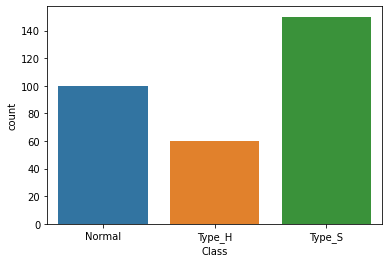

In [21]:
ax = sns.countplot(x='Class', data=All_data)


In [22]:
pd.value_counts(All_data['Class'])

Type_S    150
Normal    100
Type_H     60
Name: Class, dtype: int64

There is no null values in the datasets. And we altered the different classes into common classes name as Normal,H_type,S_type

In [23]:
# Final data without converting class to numerical
All_data

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,38.505273,16.964297,35.112814,21.540976,127.632875,7.986683,Normal
1,54.920858,18.968430,51.601455,35.952428,125.846646,2.001642,Normal
2,44.362490,8.945435,46.902096,35.417055,129.220682,4.994195,Normal
3,48.318931,17.452121,48.000000,30.866809,128.980308,-0.910941,Normal
4,45.701789,10.659859,42.577846,35.041929,130.178314,-3.388910,Normal
...,...,...,...,...,...,...,...
145,80.111572,33.942432,85.101608,46.169139,125.593624,100.292107,Type_S
146,95.480229,46.550053,59.000000,48.930176,96.683903,77.283072,Type_S
147,74.094731,18.823727,76.032156,55.271004,128.405731,73.388216,Type_S
148,87.679087,20.365613,93.822416,67.313473,120.944829,76.730629,Type_S


# One-Hot-Encoding on categorical text

In [24]:
All_data_N = pd.get_dummies(All_data,columns=['Class'])
All_data_N

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class_Normal,Class_Type_H,Class_Type_S
0,38.505273,16.964297,35.112814,21.540976,127.632875,7.986683,1,0,0
1,54.920858,18.968430,51.601455,35.952428,125.846646,2.001642,1,0,0
2,44.362490,8.945435,46.902096,35.417055,129.220682,4.994195,1,0,0
3,48.318931,17.452121,48.000000,30.866809,128.980308,-0.910941,1,0,0
4,45.701789,10.659859,42.577846,35.041929,130.178314,-3.388910,1,0,0
...,...,...,...,...,...,...,...,...,...
145,80.111572,33.942432,85.101608,46.169139,125.593624,100.292107,0,0,1
146,95.480229,46.550053,59.000000,48.930176,96.683903,77.283072,0,0,1
147,74.094731,18.823727,76.032156,55.271004,128.405731,73.388216,0,0,1
148,87.679087,20.365613,93.822416,67.313473,120.944829,76.730629,0,0,1


<a id='EDA'></a>


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data analysis & visualisation

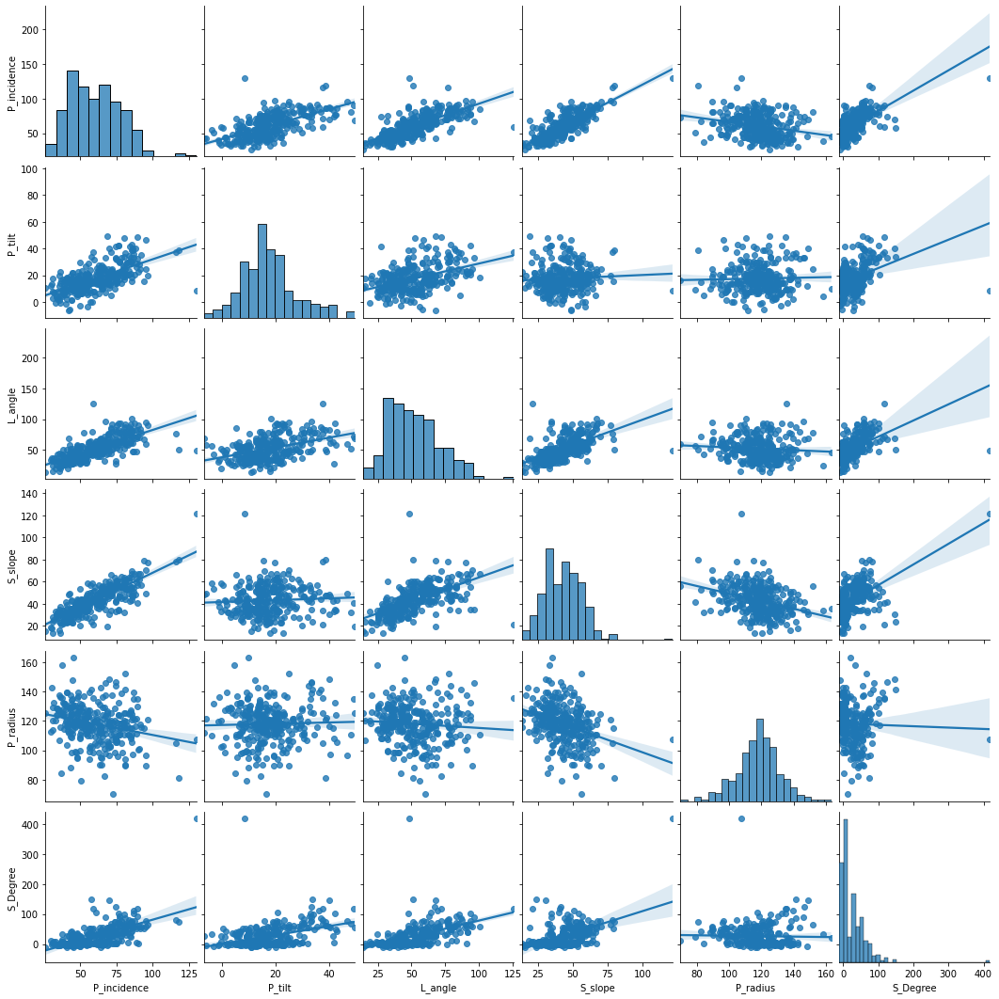

In [25]:
sns.pairplot(All_data, kind="reg")  # plots scatter plots for every pair of attributes and histograms along the diagonal
plt.show()

Along the diagonal we can see the distribution of individual variable

P_incidence has postive realtionship with all variables except P_radius. Relationship is higher for S_slope and L_angle

P_tilt has Higher Relationship with P_incidence and L_angle.There is no Relationship with s_slope and p_radius

L_angle has postive Relationship with p_tilt,s_slope and s_degree. It has no Relationship with P_radius

s_slope has positive Relationship with L_angle and s_degree

p_radius has no Relationship with s_degree,p_tilt,l_angle.

S_degree has no strong positive Relationship with any of the variables.

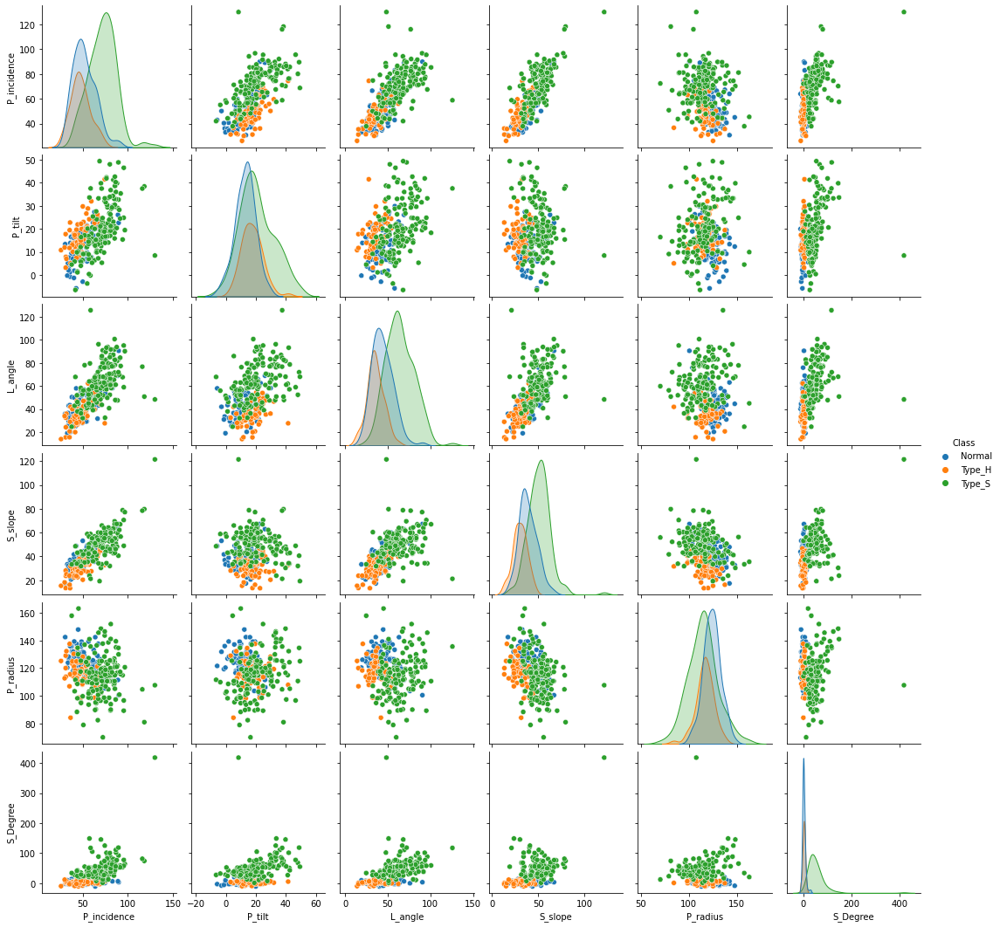

In [66]:
sns.pairplot(All_data,hue='Class');

In [67]:
class_summary=All_data.groupby('Class') #getting mean values of each class for all independent variables
class_summary.mean().reset_index()

,Class,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
0,Normal,51.685244,12.821414,43.542605,38.863830,123.890834,2.186572
1,Type_H,47.638407,17.398795,35.463524,30.239612,116.474968,2.480251
2,Type_S,71.514224,20.748038,64.110108,50.766186,114.518810,51.896687


It is clear that S_Degree of Type_S contains larger values.

In [26]:
x=All_data.corr()

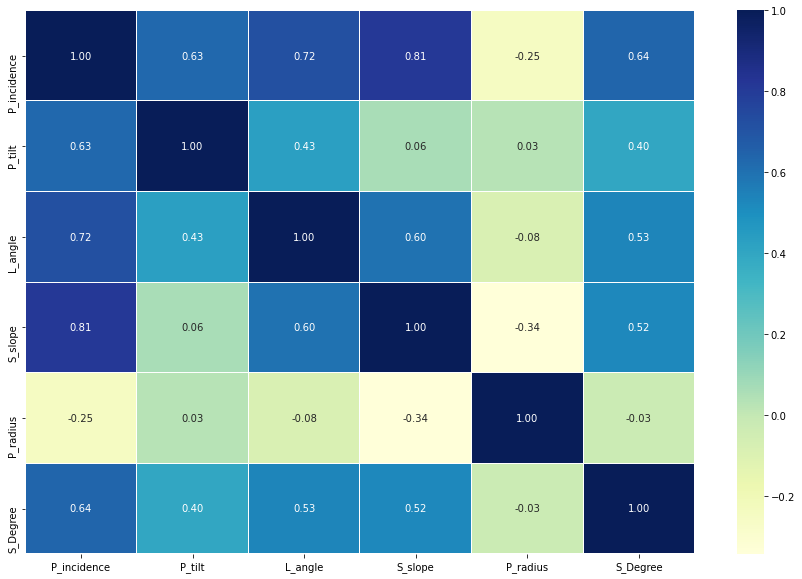

In [27]:
fig,ax = plt.subplots(figsize=(15, 10))   
sns.heatmap(x, ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="YlGnBu") # the color intensity is based on 
plt.show()

## It is seen that P_incidence has positively correlated with S_Slope and L_angle
## P_radius has negatively correlated with P_incidence,L_angle and S_slope

In [28]:
All_data.cov()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
P_incidence,297.097633,108.542318,229.392280,188.555315,-56.804919,413.513704
P_tilt,108.542318,100.166675,80.362172,8.375643,4.354120,149.557681
L_angle,229.392280,80.362172,344.253290,149.030108,-19.852220,371.897908
S_slope,188.555315,8.375643,149.030108,180.179672,-61.159039,263.956023
P_radius,-56.804919,4.354120,-19.852220,-61.159039,177.352531,-13.037396
S_Degree,413.513704,149.557681,371.897908,263.956023,-13.037396,1410.680476


## Box Plot Univarant 

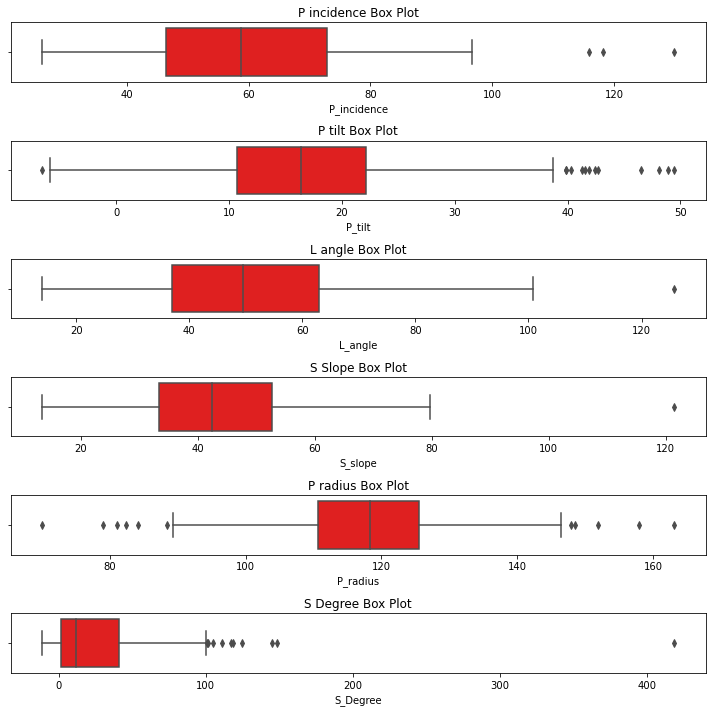

In [29]:

warnings.filterwarnings("ignore")

fig, axx = plt.subplots(6, 1)
fig.set_figheight(10)
fig.set_figwidth(10)


sns.boxplot(All_data['P_incidence'],color='r',ax = axx[0]);

sns.boxplot(All_data['P_tilt'],color='r',ax = axx[1]);

sns.boxplot(All_data['L_angle'],color='r',ax = axx[2]);

sns.boxplot(All_data['S_slope'],color='r',ax = axx[3]);

sns.boxplot(All_data['P_radius'],color='r',ax = axx[4]);

sns.boxplot(All_data['S_Degree'],color='r',ax = axx[5]);

axx[0].set_title('P incidence Box Plot');

axx[1].set_title('P tilt Box Plot');

axx[2].set_title('L angle Box Plot')

axx[3].set_title('S Slope Box Plot')

axx[4].set_title('P radius Box Plot')

axx[5].set_title('S Degree Box Plot')

fig.tight_layout()


## It is observed that there are many outliers present in P_tilt, P_radius, S_Degree

## Bi-variant Analysis 

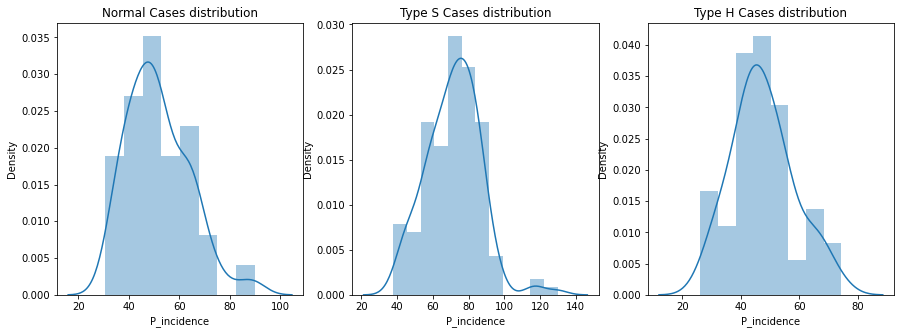

In [30]:
fig, ax = plt.subplots(1, 3)

fig.set_figheight(5)
fig.set_figwidth(15)

sns.distplot(All_data.loc[All_data.Class == 'Normal', 'P_incidence'],ax = ax[0])
sns.distplot(All_data.loc[All_data.Class =='Type_S', 'P_incidence'],ax = ax[1])
sns.distplot(All_data.loc[All_data.Class =='Type_H', 'P_incidence'], ax = ax[2])


ax[0].set_title('Normal Cases distribution')
ax[1].set_title('Type S Cases distribution')
ax[2].set_title('Type H Cases distribution')
plt.show()


In [26]:
#For Further analysis
All_data_New = All_data.copy()

# Ranges of the variable

### Let group all continous value to categorical format to analysis distribution of features

In [27]:
All_data_New['P_incidence_B'] = pd.qcut(All_data_New['P_incidence'],q=4)
All_data_New['P_incidence_B'].value_counts()
#all P_incidence values is categorized into 4 groups and each groups ranges as follow.

(26.147, 46.43]      78
(72.878, 129.834]    78
(46.43, 58.691]      77
(58.691, 72.878]     77
Name: P_incidence_B, dtype: int64

In [28]:
All_data_New['P_tilt_B'] = pd.qcut(All_data_New['P_tilt'],q=4)
All_data_New['P_tilt_B'].value_counts()
#all P_tilt values is categorized into 4 groups and each groups ranges as follow.

(-6.556, 10.667]    78
(22.12, 49.432]     78
(10.667, 16.358]    77
(16.358, 22.12]     77
Name: P_tilt_B, dtype: int64

In [29]:
All_data_New['L_angle_B'] = pd.qcut(All_data_New['L_angle'],q=4)
All_data_New['L_angle_B'].value_counts()
#all L angle values is categorized into 4 groups and each groups ranges as follow.

(13.999, 37.0]     80
(49.562, 63.0]     78
(63.0, 125.742]    77
(37.0, 49.562]     75
Name: L_angle_B, dtype: int64

In [30]:
All_data_New['S_slope_B'] = pd.qcut(All_data_New['S_slope'],q=4)
All_data_New['S_slope_B'].value_counts()
#all S_Slope values is categorized into 4 groups and each groups ranges as follow.

(13.366000000000001, 33.347]    78
(52.696, 121.43]                78
(33.347, 42.405]                77
(42.405, 52.696]                77
Name: S_slope_B, dtype: int64

In [31]:
All_data_New['P_radius_B'] = pd.qcut(All_data_New['P_radius'],q=4)
All_data_New['P_radius_B'].value_counts()
#all P_radius values is categorized into 4 groups and each groups ranges as follow.

(70.082, 110.709]     78
(125.468, 163.071]    78
(110.709, 118.268]    77
(118.268, 125.468]    77
Name: P_radius_B, dtype: int64

In [32]:
All_data_New['S_Degree_B'] = pd.qcut(All_data_New['S_Degree'],q=4)
All_data_New['S_Degree_B'].value_counts()
#all S_degree values is categorized into 4 groups and each groups ranges as follow.

(-11.059, 1.604]     78
(41.287, 418.543]    78
(1.604, 11.768]      77
(11.768, 41.287]     77
Name: S_Degree_B, dtype: int64

# Binning 

In [656]:
#Binning P_incidence

# (26.147, 46.43]      1
# (72.878, 129.834]    2
# (46.43, 58.691]      3
# (58.691, 72.878]     4

bins= ['1', '2','3', '4']
All_data_New['P_incidence_B'] = pd.qcut(All_data_New['P_incidence'],
                              q=4,
                              labels=bins)

In [657]:
#Binning  P_tilt
bins= ['1', '2','3', '4']
All_data_New['P_tilt_B'] = pd.qcut(All_data_New['P_tilt'],
                              q=4,
                              labels=bins)

In [658]:
#Binning  L_angle
bins= ['1', '2','3', '4']
All_data_New['L_angle_B'] = pd.qcut(All_data_New['L_angle'],
                              q=4,
                              labels=bins)

In [659]:
#Binning  S_slope
bins= ['1', '2','3', '4']
All_data_New['S_slope_B'] = pd.qcut(All_data_New['S_slope'],
                              q=4,
                              labels=bins)

In [660]:
#Binning  P_radius
bins= ['1', '2','3', '4']
All_data_New['P_radius_B'] = pd.qcut(All_data_New['P_radius'],
                              q=4,
                              labels=bins)

In [661]:
#Binning  S_Degree
bins= ['1', '2','3', '4']
All_data_New['S_Degree_B'] = pd.qcut(All_data_New['S_Degree'],
                              q=4,
                              labels=bins)

In [662]:
All_data_New=All_data_New.drop(["P_incidence","P_tilt","L_angle","S_slope","P_radius","S_Degree"],axis=1)

In [663]:
All_data_New.head() # Remodified Dataset sample

,Class,P_incidence_B,P_tilt_B,L_angle_B,S_slope_B,P_radius_B,S_Degree_B
0,Normal,1,3,1,1,4,2
1,Normal,2,3,3,2,4,2
2,Normal,1,1,2,2,4,2
3,Normal,2,3,2,1,4,1
4,Normal,1,1,2,2,4,1


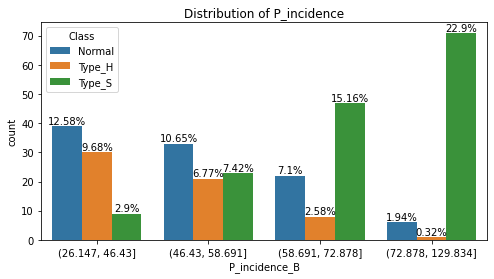

In [42]:


fig, ax = plt.subplots()
width = len(All_data_New['P_incidence_B'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = All_data_New, x= 'P_incidence_B',hue="Class") 
plt.title('Distribution of P_incidence')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(All_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

## All cases falls under 4 groups but as P_incidence value increases majority of classes can be seen as Type S.
## Higher P_incidence --> Mostly likely cases will be Type-S

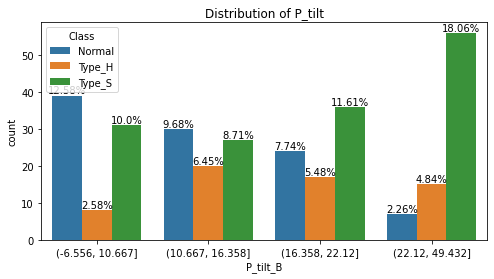

In [34]:
fig, ax = plt.subplots()
width = len(All_data_New['P_tilt_B'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = All_data_New, x= 'P_tilt_B',hue="Class") 
plt.title('Distribution of P_tilt')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(All_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

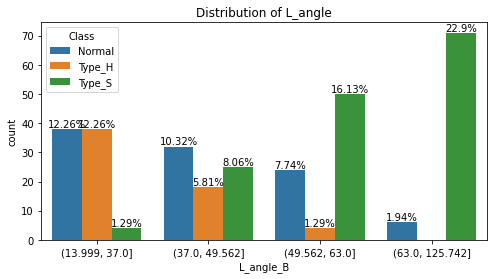

In [35]:
fig, ax = plt.subplots()
width = len(All_data_New['L_angle_B'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = All_data_New, x= 'L_angle_B',hue="Class") 
plt.title('Distribution of L_angle')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(All_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

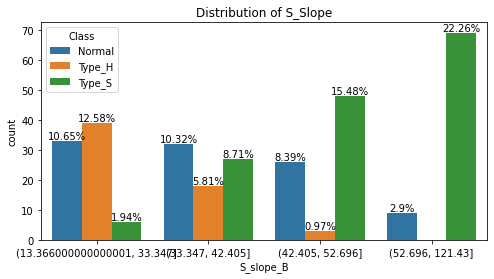

In [36]:
fig, ax = plt.subplots()
width = len(All_data_New['S_slope_B'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = All_data_New, x= 'S_slope_B',hue="Class") 
plt.title('Distribution of S_Slope')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(All_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

## From above Chart --> Higher values of S_Slope dont have Type_H cases
## Lower S_Slope value higher Type-S cases than Normal Cases

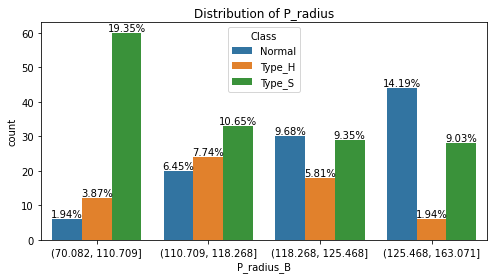

In [37]:
fig, ax = plt.subplots()
width = len(All_data_New['P_radius_B'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = All_data_New, x= 'P_radius_B',hue="Class") 
plt.title('Distribution of P_radius')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(All_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

## Lower P_radius value --> Higher Type S cases 

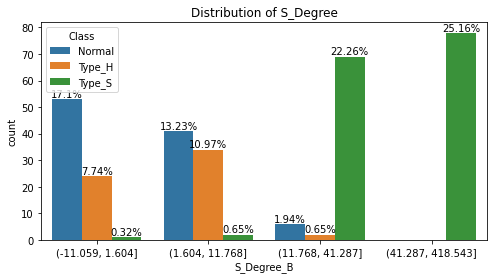

In [38]:
fig, ax = plt.subplots()
width = len(All_data_New['S_Degree_B'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = All_data_New, x= 'S_Degree_B',hue="Class") 
plt.title('Distribution of S_Degree')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(All_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

## Higher S_Degree value --> more number of Type S cases
## Lower S_Degree value --> more number of Normal cases

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Summary

In [43]:
import pandas_profiling
pandas_profiling.ProfileReport(All_data)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data Pre-processing
    

# Segregate predictors vs target attributes

In [44]:
# Select independent features for model building.
X = All_data.iloc[:,:-1] # Features

y = All_data['Class'] # Target

## Performing normalisation or scaling 


In [45]:
XScaled  = X.apply(zscore)  # convert all attributes to Z scale 

XScaled.describe()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
count,3.100000e+02,3.100000e+02,3.100000e+02,3.100000e+02,3.100000e+02,3.100000e+02
mean,1.042177e-16,2.096889e-16,1.980495e-16,2.829278e-17,-5.071212e-16,-1.277204e-16
std,1.001617e+00,1.001617e+00,1.001617e+00,1.001617e+00,1.001617e+00,1.001617e+00
min,-1.996010e+00,-2.411664e+00,-2.047652e+00,-2.207741e+00,-3.597963e+00,-9.961725e-01
25%,-8.173982e-01,-6.881138e-01,-8.060267e-01,-7.168418e-01,-5.423830e-01,-6.585073e-01
50%,-1.049246e-01,-1.186061e-01,-1.278621e-01,-4.095971e-02,2.613767e-02,-3.874502e-01
75%,7.194643e-01,4.581158e-01,5.975493e-01,7.269414e-01,5.676209e-01,3.997679e-01
max,4.029206e+00,3.191402e+00,3.984615e+00,5.855771e+00,3.395818e+00,1.046035e+01


## Percentage of the data 

In [46]:
n_normal = len(All_data.loc[All_data['Class'] == 'Normal'])
n_type_s = len(All_data.loc[All_data['Class'] == 'Type_S'])
n_type_h = len(All_data.loc[All_data['Class'] == 'Type_H'])
print("Number of Normal cases: {0} ({1:2.2f}%)".format(n_normal, (n_normal / (n_normal + n_type_h + n_type_s)) * 100 ))
print("Number of Type S cases: {0} ({1:2.2f}%)".format(n_type_s, (n_type_s / (n_normal + n_type_h + n_type_s) * 100)))  
print("Number of Type H cases: {0} ({1:2.2f}%)".format(n_type_h, (n_type_h / (n_normal + n_type_h + n_type_s) * 100)))


Number of Normal cases: 100 (32.26%)
Number of Type S cases: 150 (48.39%)
Number of Type H cases: 60 (19.35%)


## Observation :Class distribution among Normal, Type H & Type S in dataset is almost 2:1:3 respectively

# Train and Test Split

In [47]:
# split data into train subset and test subset
X_train, X_test, y_train, y_test = train_test_split(XScaled, y, test_size=0.3, random_state=42)

# checking the dimensions of the train & test subset
# to print dimension of train set
print(X_train.shape)
# to print dimension of test set
print(X_test.shape)

(217, 6)
(93, 6)


In [48]:
print("{0:0.2f}% data is in training set".format((len(X_train)/len(All_data.index)) * 100))
print("{0:0.2f}% data is in test set".format((len(X_test)/len(All_data.index)) * 100))

70.00% data is in training set
30.00% data is in test set


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Model Building
    

# KNN Classifier

# Choosing Optimal K  value

In [49]:
# empty list that will hold accuracy scores
from sklearn.neighbors import KNeighborsClassifier
accuracy_scores = []
myList = list(range(1, 22))

# subsetting just the odd ones
neighbors = list(filter(lambda x: x % 2 != 0, myList))
for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors = k)
    knn.fit(X_train, y_train)
    # predict the response
    y_predictKNN = knn.predict(X_test)
    # evaluate accuracy
    scores = accuracy_score(y_test, y_predictKNN)
    accuracy_scores.append(scores)

# changing to misclassification error
MSE = [1 - x for x in accuracy_scores]

# determining best k
optimal_k = neighbors[MSE.index(min(MSE))]
print('The optimal number of neighbors is: ', optimal_k)

The optimal number of neighbors is:  19


In [50]:
# choose K value as 19 because we have 3 type of category in target set,so there wont be tie
NNH = KNeighborsClassifier(n_neighbors=  19, weights = 'uniform' )
NNH.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=19)

### Performance of our model with training data


In [51]:
train_predict = NNH.predict(X_train)

from sklearn import metrics

print("Model Accuracy: {:.4f}".format(metrics.accuracy_score(y_train, train_predict)))
print()

Model Accuracy: 0.7788



### Performance of our model with testing data


In [52]:
test_predict = NNH.predict(X_test)

from sklearn import metrics

print("Model Accuracy: {0:.4f}".format(metrics.accuracy_score(y_test, test_predict)))
print()

Model Accuracy: 0.8602



### Testing data has sightly higher accuray than training data

Confusion Matrix


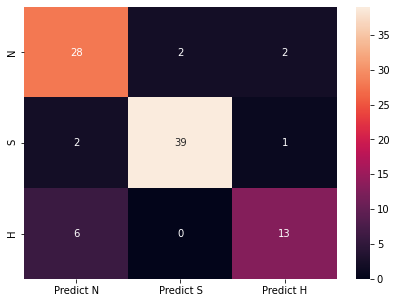

In [53]:
# calculate confusion matrix
from sklearn import metrics

print("Confusion Matrix")
cm=metrics.confusion_matrix(y_test, test_predict, labels=["Normal","Type_S","Type_H"])

df_cm = pd.DataFrame(cm, index = [i for i in ["N","S","H"]],
                  columns = [i for i in ["Predict N","Predict S","Predict H"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True);

In [54]:
print("Classification Report")

print(metrics.classification_report(y_test, test_predict, labels=["Normal","Type_S","Type_H"]))

Classification Report
              precision    recall  f1-score   support

      Normal       0.78      0.88      0.82        32
      Type_S       0.95      0.93      0.94        42
      Type_H       0.81      0.68      0.74        19

    accuracy                           0.86        93
   macro avg       0.85      0.83      0.84        93
weighted avg       0.86      0.86      0.86        93



# Observation:

## As we have 3 type of cases, our model F1- Score lies around 86%

# Error Rate calculation

Minimum error:- 0.13978494623655913 at K = 18


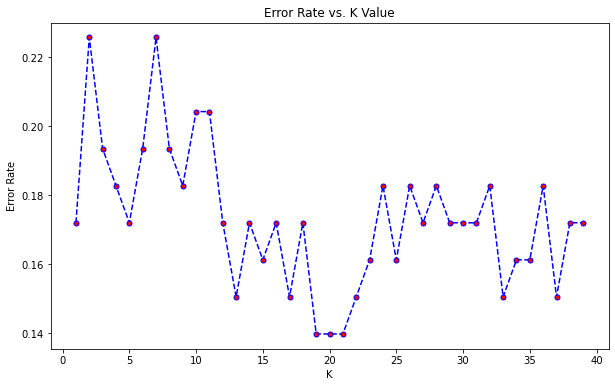

In [55]:
error_rate = []
for i in range(1,40):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=5)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

# Accuracy for Minimum error rate

Maximum accuracy:- 0.8602150537634409 at K = 18


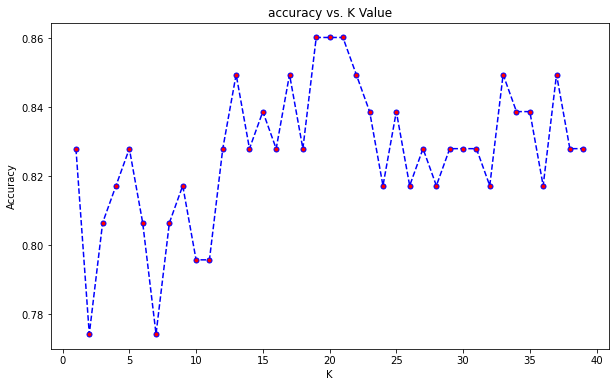

In [56]:
acc = []
# Will take some time

for i in range(1,40):
    neigh = KNeighborsClassifier(n_neighbors = i).fit(X_train,y_train)
    yhat = neigh.predict(X_test)
    acc.append(metrics.accuracy_score(y_test, yhat))
    
plt.figure(figsize=(10,6))
plt.plot(range(1,40),acc,color = 'blue',linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=5)
plt.title('accuracy vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy')
print("Maximum accuracy:-",max(acc),"at K =",acc.index(max(acc)))


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Posible tunning with hyper parameter tuning

In [57]:
from sklearn.model_selection import GridSearchCV
grid_params = { 'n_neighbors' : [5,7,9,11,13],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']}
gs = GridSearchCV(KNeighborsClassifier(), grid_params, verbose = 1, cv=5, n_jobs = -1)
# fit the model on our train set
g_res = gs.fit(X_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


In [58]:
# find the best score
g_res.best_score_

0.7923890063424948

In [59]:
# get the hyperparameters with the best score
g_res.best_params_

{'metric': 'minkowski', 'n_neighbors': 13, 'weights': 'distance'}

In [60]:
# use the best hyperparameters
knn = KNeighborsClassifier(n_neighbors = 13, weights = 'distance',metric = 'minkowski')
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=13, weights='distance')

In [61]:
# get a prediction
y_hat = knn.predict(X_train)
y_knn = knn.predict(X_test)


In [62]:
print('Training set accuracy: ', metrics.accuracy_score(y_train, y_hat))
print('Test set accuracy: ',metrics.accuracy_score(y_test, y_knn))

Training set accuracy:  1.0
Test set accuracy:  0.8602150537634409


In [63]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(knn, X, y, cv =5)

In [64]:
print('Model accuracy: ',np.mean(scores))

Model accuracy:  0.832258064516129


# Observation

All the variables has significant effect on target class

class belongs to type_s has higher mean value for alomst all variables

Class belongs to normal has lower values for all variables

For almost all variables the distribution is normal

For Knn, k=13 we are getting balanced train and test error

# Suggestion
Clear description on each variables may help to understand problem statement better because of medical domain

# PART 2 -- DOMAIN :- Banking and Finance 

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Import and warehouse data

## Task: Import all the given datasets and explore shape and size of each

In [11]:
Bank1 = pd.read_csv('Part2 - Data1.csv')
Bank1.head()

,ID,Age,CustomerSince,HighestSpend,ZipCode,HiddenScore,MonthlyAverageSpend,Level
0,1,25,1,49,91107,4,1.6,1
1,2,45,19,34,90089,3,1.5,1
2,3,39,15,11,94720,1,1.0,1
3,4,35,9,100,94112,1,2.7,2
4,5,35,8,45,91330,4,1.0,2


In [12]:
Bank2 = pd.read_csv('Part2 -Data2.csv')
Bank2.head()

,ID,Mortgage,Security,FixedDepositAccount,InternetBanking,CreditCard,LoanOnCard
0,1,0,1,0,0,0,NaN
1,2,0,1,0,0,0,NaN
2,3,0,0,0,0,0,NaN
3,4,0,0,0,0,0,NaN
4,5,0,0,0,0,1,NaN


In [13]:
print(Bank1.shape)
print(Bank2.shape)

(5000, 8)
(5000, 7)


## Task: Merge all datasets onto one and explore final shape and size

In [14]:
Com_data = pd.merge(Bank1,Bank2,how='left',on='ID')

In [15]:
Com_data.head() #sample

,ID,Age,CustomerSince,HighestSpend,ZipCode,HiddenScore,MonthlyAverageSpend,Level,Mortgage,Security,FixedDepositAccount,InternetBanking,CreditCard,LoanOnCard
0,1,25,1,49,91107,4,1.6,1,0,1,0,0,0,NaN
1,2,45,19,34,90089,3,1.5,1,0,1,0,0,0,NaN
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,NaN
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,NaN
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,1,NaN


In [16]:
Com_data.tail() #sample

,ID,Age,CustomerSince,HighestSpend,ZipCode,HiddenScore,MonthlyAverageSpend,Level,Mortgage,Security,FixedDepositAccount,InternetBanking,CreditCard,LoanOnCard
4995,4996,29,3,40,92697,1,1.9,3,0,0,0,1,0,0.0
4996,4997,30,4,15,92037,4,0.4,1,85,0,0,1,0,0.0
4997,4998,63,39,24,93023,2,0.3,3,0,0,0,0,0,0.0
4998,4999,65,40,49,90034,3,0.5,2,0,0,0,1,0,0.0
4999,5000,28,4,83,92612,3,0.8,1,0,0,0,1,1,0.0


In [17]:
Com_data.shape

(5000, 14)

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data Cleaning

In [18]:
Com_data.dtypes

ID                       int64
Age                      int64
CustomerSince            int64
HighestSpend             int64
ZipCode                  int64
HiddenScore              int64
MonthlyAverageSpend    float64
Level                    int64
Mortgage                 int64
Security                 int64
FixedDepositAccount      int64
InternetBanking          int64
CreditCard               int64
LoanOnCard             float64
dtype: object

In [19]:
Com_data.dtypes

ID                       int64
Age                      int64
CustomerSince            int64
HighestSpend             int64
ZipCode                  int64
HiddenScore              int64
MonthlyAverageSpend    float64
Level                    int64
Mortgage                 int64
Security                 int64
FixedDepositAccount      int64
InternetBanking          int64
CreditCard               int64
LoanOnCard             float64
dtype: object

In [20]:
Com_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   5000 non-null   int64  
 1   Age                  5000 non-null   int64  
 2   CustomerSince        5000 non-null   int64  
 3   HighestSpend         5000 non-null   int64  
 4   ZipCode              5000 non-null   int64  
 5   HiddenScore          5000 non-null   int64  
 6   MonthlyAverageSpend  5000 non-null   float64
 7   Level                5000 non-null   int64  
 8   Mortgage             5000 non-null   int64  
 9   Security             5000 non-null   int64  
 10  FixedDepositAccount  5000 non-null   int64  
 11  InternetBanking      5000 non-null   int64  
 12  CreditCard           5000 non-null   int64  
 13  LoanOnCard           4980 non-null   float64
dtypes: float64(2), int64(12)
memory usage: 585.9 KB


In [21]:
Com_data.isna().sum()

ID                      0
Age                     0
CustomerSince           0
HighestSpend            0
ZipCode                 0
HiddenScore             0
MonthlyAverageSpend     0
Level                   0
Mortgage                0
Security                0
FixedDepositAccount     0
InternetBanking         0
CreditCard              0
LoanOnCard             20
dtype: int64

In [22]:
Com_data = Com_data.dropna() # drop null values

In [23]:
Com_data.drop('ID',
  axis=1, inplace=True) # ID is identification,so it is droped

In [24]:
Com_data.drop('ZipCode',
  axis=1, inplace=True) # Zipcode is identification,so it is droped

In [25]:
Com_data.shape # Final shape after droping the null values

(4980, 12)

In [34]:
# Original dataframe size
Original_size = Com_data.size

# drop dataframe
Com_data.dropna(inplace=True)

# New dataframe size
New_size=Com_data.size

print("> Original:",Original_size,"vs","New:",New_size)

# Data drop impact analysis

Data_lost=100*((Original_size-New_size)/Original_size)
print("> Percentage of data lost",Data_lost,"%")
if Data_lost<= 5:
    print("\n> Not much data has been lost,dropping data was a good option")
else:
    print("\n> Considerable data has been lost,dropping data was not a good option. We need to impute data")

> Original: 59760 vs New: 59760
> Percentage of data lost 0.0 %

> Not much data has been lost,dropping data was a good option


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data analysis & visualisation:

In [474]:
Com_data.describe(include='all').transpose()

,count,mean,std,min,25%,50%,75%,max
Age,4980.0,45.352610,11.464212,23.0,35.0,45.0,55.000,67.0
CustomerSince,4980.0,20.117671,11.468716,-3.0,10.0,20.0,30.000,43.0
HighestSpend,4980.0,73.852410,46.070090,8.0,39.0,64.0,98.000,224.0
HiddenScore,4980.0,2.395582,1.147200,1.0,1.0,2.0,3.000,4.0
MonthlyAverageSpend,4980.0,1.939536,1.750006,0.0,0.7,1.5,2.525,10.0
Level,4980.0,1.880924,0.840144,1.0,1.0,2.0,3.000,3.0
Mortgage,4980.0,56.589759,101.836758,0.0,0.0,0.0,101.000,635.0
Security,4980.0,0.104418,0.305832,0.0,0.0,0.0,0.000,1.0
FixedDepositAccount,4980.0,0.060643,0.238697,0.0,0.0,0.0,0.000,1.0
InternetBanking,4980.0,0.597189,0.490513,0.0,0.0,1.0,1.000,1.0


In [475]:
import plotly.express as px
fig = px.histogram(Com_data, x="Age")  
fig.show()

### Dataset has more age distribution between 40- 60

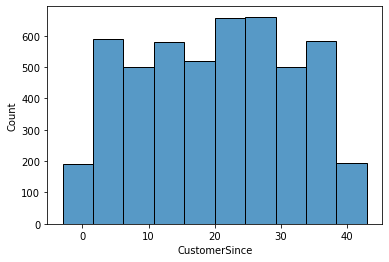

In [476]:
sns.histplot(Com_data['CustomerSince'],bins=10);

### Max retained customer to this bank about 20-30 years

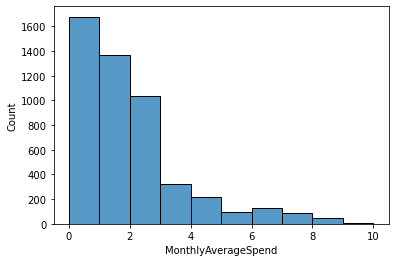

In [477]:
sns.histplot(Com_data['MonthlyAverageSpend'],bins=10);

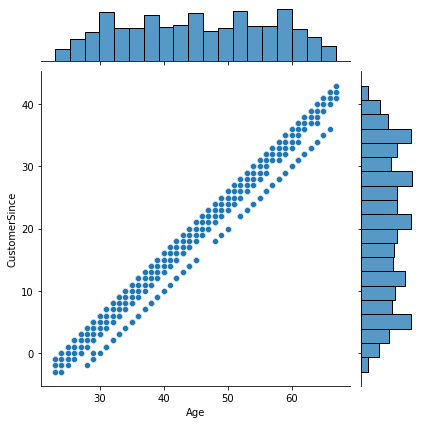

In [478]:
sns.jointplot(Com_data['Age'],Com_data['CustomerSince'],kind='scatter');

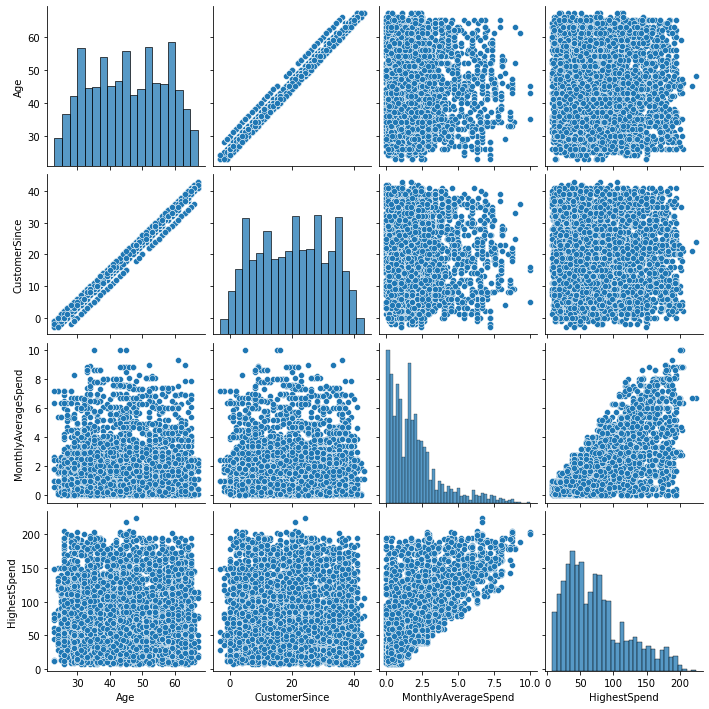

In [479]:
sns.pairplot(Com_data[['Age','CustomerSince','MonthlyAverageSpend','HighestSpend']]);

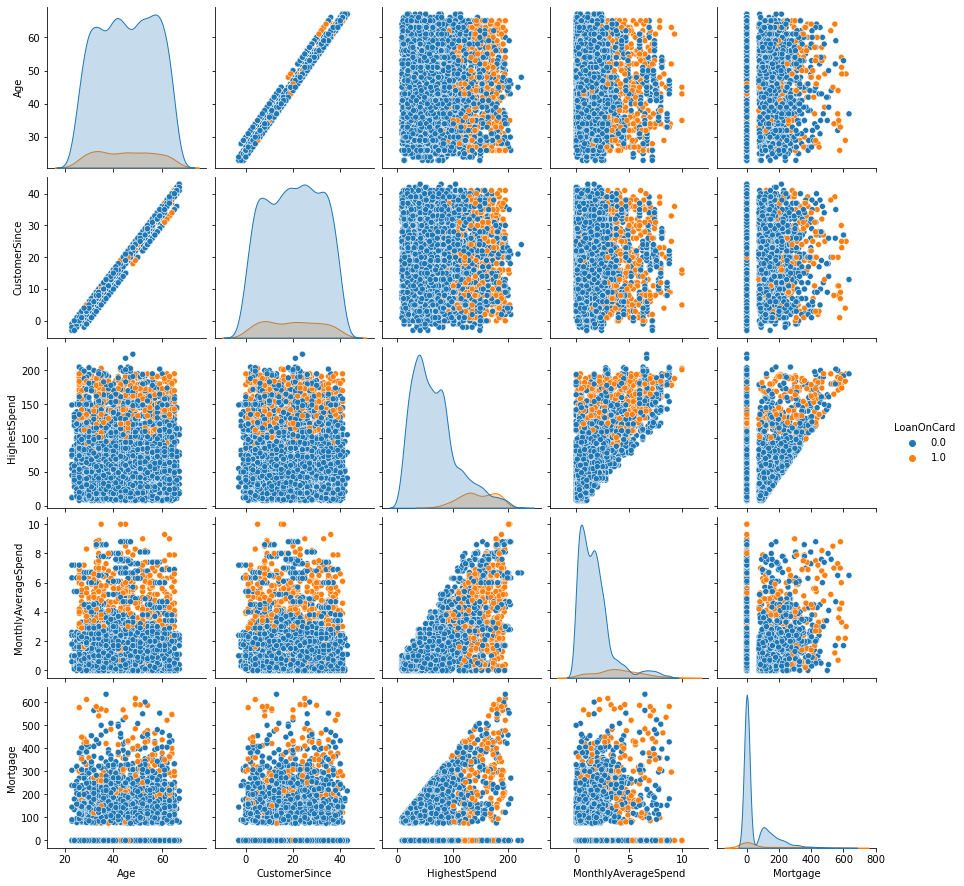

In [480]:
tb1 = Com_data[['Age','CustomerSince','HighestSpend','MonthlyAverageSpend','Mortgage','LoanOnCard']]
sns.pairplot(tb1,diag_kind='kde',hue="LoanOnCard");

In [481]:
c=Com_data.corr()

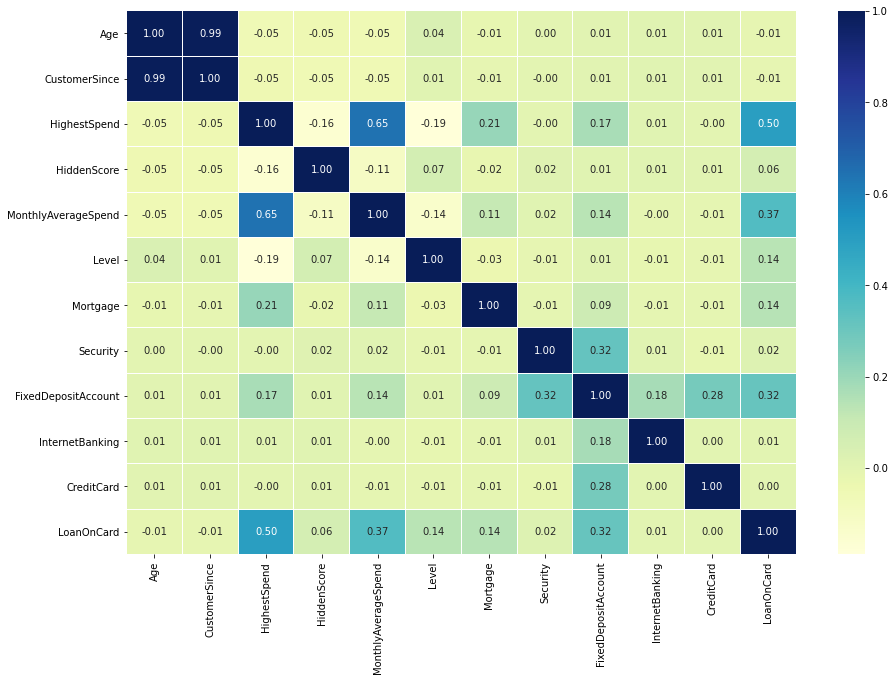

In [482]:
fig,ax = plt.subplots(figsize=(15, 10))   
sns.heatmap(c, ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="YlGnBu") # the color intensity is based on 
plt.show()

## Observation
#### 1.Age and Experience are highly correlated which is quite intutive, will be dropping Experience from further analysis
#### 2.There are some varible which has no correlation.
#### 3. Loan on Card is correlated with Highest spend by customer.
#### 4. Monthly avg spend is correlated with Highest spend

## Box Plot Univariant analysis

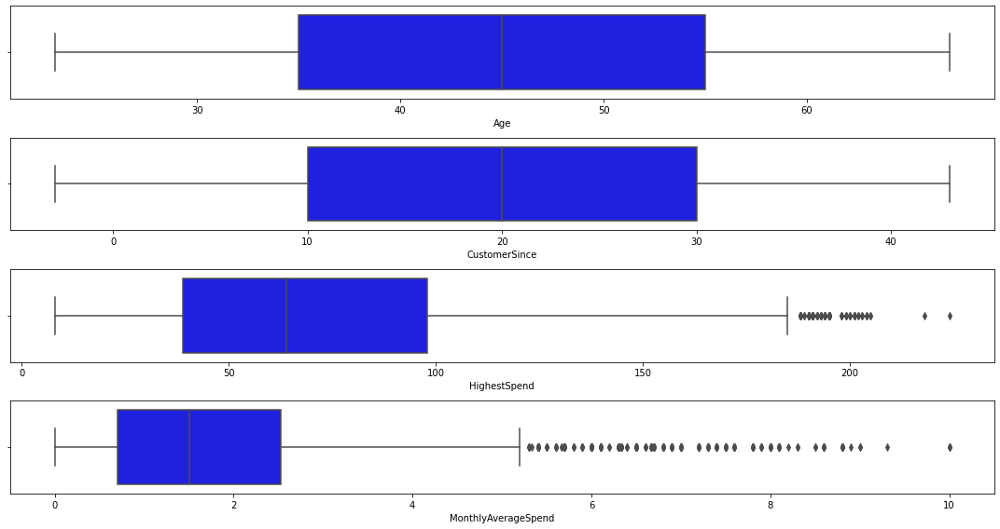

In [483]:
fig, axxx = plt.subplots(4, 1)
fig.set_figheight(8)
fig.set_figwidth(15)


sns.boxplot(Com_data['Age'],color='b',ax = axxx[0]);

sns.boxplot(Com_data['CustomerSince'],color='b',ax = axxx[1]);

sns.boxplot(Com_data['HighestSpend'],color='b',ax = axxx[2]);

sns.boxplot(Com_data['MonthlyAverageSpend'],color='b',ax = axxx[3]);

fig.tight_layout()


## Further Analysis on Dataset

In [484]:
Com_data['Security'] = Com_data['Security'].astype('category')
Com_data['FixedDepositAccount']=Com_data['FixedDepositAccount'].astype('category')
Com_data['InternetBanking']=Com_data['InternetBanking'].astype('category')
Com_data['CreditCard']=Com_data['CreditCard'].astype('category')
Com_data['LoanOnCard']=Com_data['LoanOnCard'].astype('category')

In [485]:
# For Further analysis -- the Mortgage variable has been converted to binary variable( customers with/without mortgage)
Com_data['Mortgage_B'] = '-999'
Com_data.loc[(Com_data['Mortgage'] > 0), 'Mortgage_B'] = '1'
Com_data.loc[(Com_data['Mortgage'] == 0), 'Mortgage_B'] = '0'
Com_data=Com_data.drop(columns=['Mortgage'])


In [486]:
Com_data.rename(columns={'Mortgage_B':'Mortgage'}, inplace=True)
Com_data['Mortgage']=Com_data['Mortgage'].astype('category')

In [487]:
Com_data.dtypes.to_frame(name=" Data Type")

,Data Type
Age,int64
CustomerSince,int64
HighestSpend,int64
HiddenScore,int64
MonthlyAverageSpend,float64
Level,int64
Security,category
FixedDepositAccount,category
InternetBanking,category
CreditCard,category


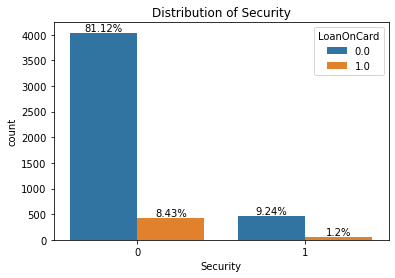

In [488]:
fig, ax = plt.subplots()
width = len(Com_data['Security'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = Com_data, x= 'Security',hue="LoanOnCard") 
plt.title('Distribution of Security')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(Com_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

Customer not having a securities account are more likely to respond positively

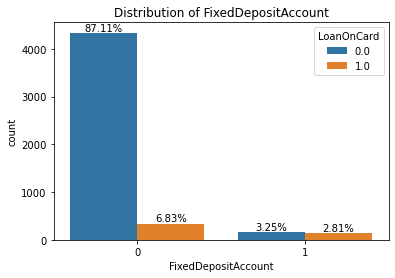

In [489]:
fig, ax = plt.subplots()
width = len(Com_data['FixedDepositAccount'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = Com_data, x= 'FixedDepositAccount',hue="LoanOnCard") 
plt.title('Distribution of FixedDepositAccount')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(Com_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

Customer not having a FDA account are more likely to respond positively

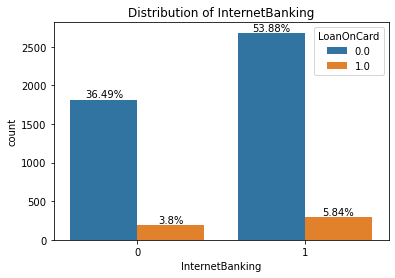

In [490]:
fig, ax = plt.subplots()
width = len(Com_data['InternetBanking'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = Com_data, x= 'InternetBanking',hue="LoanOnCard") 
plt.title('Distribution of InternetBanking')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(Com_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

Customer having a InternetBanking are more likely to respond positively

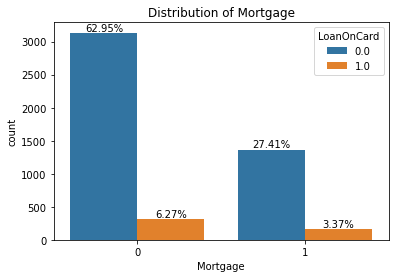

In [491]:
fig, ax = plt.subplots()
width = len(Com_data['Mortgage'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = Com_data, x= 'Mortgage',hue="LoanOnCard") 
plt.title('Distribution of Mortgage')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(Com_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

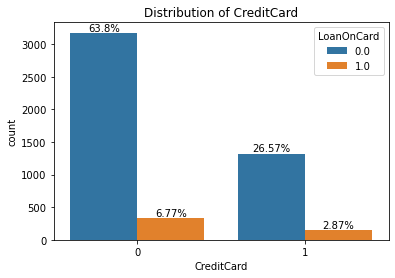

In [600]:
fig, ax = plt.subplots()
width = len(Com_data['CreditCard'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = Com_data, x= 'CreditCard',hue="LoanOnCard") 
plt.title('Distribution of CreditCard')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(Com_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

Customer who do not hold a credit card provided by the bank are more likely to reponnd postively to the survey

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Summary

In [492]:
pandas_profiling.ProfileReport(Com_data)

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Customer without a mortgage are likely to respond positively

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data pre-processing:

In [35]:
# Up-sample

from sklearn.utils import resample

# Separate majority and minority classes
df_majority = Com_data[Com_data['LoanOnCard']==0]
df_minority = Com_data[Com_data['LoanOnCard']==1]
 
# Upsample minority class
df_minority_upsampled = resample(df_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples=4400,    # to match majority class
                                 random_state=123) # reproducible results
 
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
 
# Display new class counts
df_upsampled['LoanOnCard'].value_counts()

0.0    4500
1.0    4400
Name: LoanOnCard, dtype: int64

In [36]:
# Down-sample

from sklearn.utils import resample

# Separate majority and minority classes
df_majority = Com_data[Com_data['LoanOnCard']==0]
df_minority = Com_data[Com_data['LoanOnCard']==1]
 
# Downsample majority  class
df_majority_downsampled = resample(df_majority, 
                                 replace=False,    # sample without replacement
                                 n_samples=600,     # to match minority class
                                 random_state=123) # reproducible results
 
# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority])
 
# Display new class counts
df_downsampled['LoanOnCard'].value_counts()

0.0    600
1.0    480
Name: LoanOnCard, dtype: int64

# Segregate predictors vs target attributes

In [55]:
X1 = Com_data.drop(['LoanOnCard','CustomerSince'],axis=1)  # Features
#Since Age and CustomerSince has high correlation, we are dropping CustomerSince in dataset
y1 = Com_data['LoanOnCard'] # Target

In [56]:
#Distribution of target variable
positive_response = len(Com_data.loc[Com_data['LoanOnCard'] == 1])
negative_response = len(Com_data.loc[Com_data['LoanOnCard'] == 0])
print("Number of positive responses: {0} ({1:2.2f}%)".format(positive_response, (positive_response / (positive_response + negative_response)) * 100 ))
print("Number of negative responses: {0} ({1:2.2f}%)".format(negative_response, (negative_response / (positive_response + negative_response)) * 100))

Number of positive responses: 480 (9.64%)
Number of negative responses: 4500 (90.36%)


#### There is imbalance in the target field. only 9.5% customer has borrowed loan from the bank

# Perform train-test split.

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.3, random_state=42)
# checking the dimensions of the train & test subset
# to print dimension of train set
print(X_train.shape)
# to print dimension of test set
print(X_test.shape)

(3486, 10)
(1494, 10)


In [498]:
print("Original Positive Response    : {0} ({1:0.2f}%)".format(len(Com_data.loc[Com_data['LoanOnCard'] == 1]), (len(Com_data.loc[Com_data['LoanOnCard'] == 1])/len(Com_data.index)) * 100))
print("Original Negative Response   : {0} ({1:0.2f}%)".format(len(Com_data.loc[Com_data['LoanOnCard'] == 0]), (len(Com_data.loc[Com_data['LoanOnCard'] == 0])/len(Com_data.index)) * 100))
print("")
print("Training Positive Response    : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 1]), (len(y_train[y_train[:] == 1])/len(y_train)) * 100))
print("Training Negative Response   : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 0]), (len(y_train[y_train[:] == 0])/len(y_train)) * 100))
print("")
print("Test Positive Response        : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 1]), (len(y_test[y_test[:] == 1])/len(y_test)) * 100))
print("Test Negative Response       : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 0]), (len(y_test[y_test[:] == 0])/len(y_test)) * 100))
print("")

Original Positive Response    : 480 (9.64%)
Original Negative Response   : 4500 (90.36%)

Training Positive Response    : 336 (9.64%)
Training Negative Response   : 3150 (90.36%)

Test Positive Response        : 144 (9.64%)
Test Negative Response       : 1350 (90.36%)



# Model training, testing and tuning:

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Logistic Regression:

In [58]:
model1 = LogisticRegression(solver="liblinear",random_state=0)
model1.fit(X_train, y_train)

LogisticRegression(random_state=0, solver='liblinear')

In [60]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name,model1.coef_[0][idx]))

The coefficient for Age is -0.01504260193886538
The coefficient for HighestSpend is 0.04347102513762863
The coefficient for HiddenScore is 0.47639810760562407
The coefficient for MonthlyAverageSpend is 0.10641977152776544
The coefficient for Level is 1.2337532003020868
The coefficient for Mortgage is -1.7271997338609256e-05
The coefficient for Security is -0.45956897896685833
The coefficient for FixedDepositAccount is 3.0310957916316825
The coefficient for InternetBanking is -0.7410580595684284
The coefficient for CreditCard is -0.8681542066560038


Age,Security,InternetBanking,Creditcard has negative impact towards logodds ratio of response

In [501]:
intercept = model1.intercept_[0]
print("The intercept for our Logistic Regression model is {}".format(intercept))

The intercept for our Logistic Regression model is -9.544941725784163


### Performance of our model with training data


In [61]:
#predicting on train data
train_predict_log = model1.predict(X_train)
print("Model Accuracy on train: {0:.4f}".format(metrics.accuracy_score(y_train, train_predict_log)))
print()

Model Accuracy on train: 0.9495



### Performance of our model with testing data


In [62]:
#predicting on test data
test_predict_log = model1.predict(X_test)
print("Model Accuracy on test: {0:.4f}".format(metrics.accuracy_score(y_test, test_predict_log)))
print()

Model Accuracy on test: 0.9438



Confusion Matrix


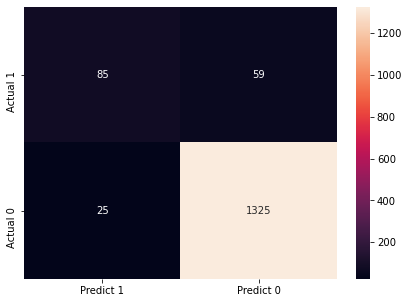

In [63]:
# calculate confusion matrix

print("Confusion Matrix")
cm=metrics.confusion_matrix(y_test, test_predict_log, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["Actual 1","Actual 0"]],
                  columns = [i for i in ["Predict 1","Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True,fmt = 'd');

In [505]:
#Printing the classification report
print("Classification Report")
print(metrics.classification_report(y_test, test_predict_log, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.77      0.59      0.67       144
           0       0.96      0.98      0.97      1350

    accuracy                           0.94      1494
   macro avg       0.87      0.79      0.82      1494
weighted avg       0.94      0.94      0.94      1494



Overall accuray of the model comes 94%

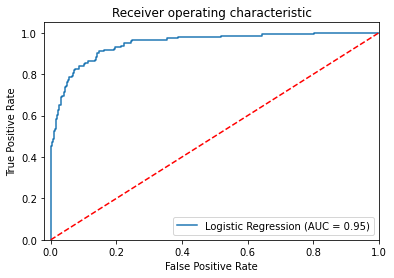

In [506]:
#Plotting ROC and AUC
probs = model1.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc_log = metrics.auc(fpr, tpr)
plt.plot(fpr, tpr, label='Logistic Regression (AUC = %0.2f)' % roc_auc_log)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [507]:
precision_log, recall_log, f1_score_log, support = precision_recall_fscore_support(y_test, test_predict_log, average = 'macro')
print('Precision Score :', '%0.2f' % precision_log)
print('Recall Score :', '%0.2f' % recall_log)
print('F1-Score:', '%0.2f' % f1_score_log)
log_acc= accuracy_score(y_test, test_predict_log)
print('Accuracy Score :','%0.2f' % log_acc)
print('AUC :','%0.2f' % roc_auc_log)

Precision Score : 0.87
Recall Score : 0.79
F1-Score: 0.82
Accuracy Score : 0.94
AUC : 0.95


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Navie Bayes:

In [568]:
X2 = Com_data.drop(['LoanOnCard','CustomerSince'],axis=1)  # Features
#Since Age and CustomerSince has high correlation, we are dropping CustomerSince in dataset
y2 = Com_data['LoanOnCard'] # Target

In [569]:
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.3, random_state=42)
# checking the dimensions of the train & test subset
# to print dimension of train set
print(X_train.shape)
# to print dimension of test set
print(X_test.shape)

(3486, 10)
(1494, 10)


In [599]:
Com_data.dtypes

Age                       int64
CustomerSince             int64
HighestSpend              int64
HiddenScore               int64
MonthlyAverageSpend     float64
Level                     int64
Security               category
FixedDepositAccount    category
InternetBanking        category
CreditCard             category
LoanOnCard             category
Mortgage               category
dtype: object

In [570]:
#creating GNB 
model2 = GaussianNB()

model2.fit(X_train, y_train.ravel())

GaussianNB()

### Performance of our model with training data

In [571]:
train_predict_nb = model2.predict(X_train)
print("Model Accuracy: {:.4f}".format(metrics.accuracy_score(y_train, train_predict_nb)))
print()

Model Accuracy: 0.8933



### Performance of our model with testing data

In [572]:
test_predict_nb = model2.predict(X_test)
print("Model Accuracy: {0:.4f}".format(metrics.accuracy_score(y_test,test_predict_nb)))
print()

Model Accuracy: 0.8775



Confusion Matrix


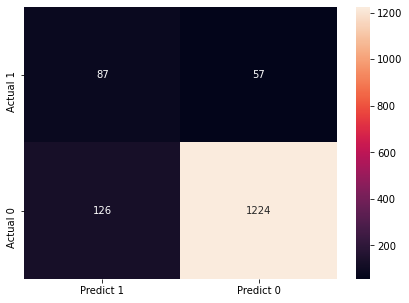

In [573]:
# calculate confusion matrix

print("Confusion Matrix")
cm=metrics.confusion_matrix(y_test, test_predict_nb, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["Actual 1","Actual 0"]],
                  columns = [i for i in ["Predict 1","Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True,fmt = 'd');

In [574]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, test_predict_nb, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.41      0.60      0.49       144
           0       0.96      0.91      0.93      1350

    accuracy                           0.88      1494
   macro avg       0.68      0.76      0.71      1494
weighted avg       0.90      0.88      0.89      1494



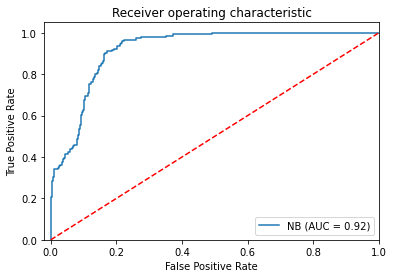

In [575]:
#plotting ROC and AUC
probs = model2.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc_nb = metrics.auc(fpr, tpr)
plt.plot(fpr, tpr, label='NB (AUC = %0.2f)' % roc_auc_nb)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('NB_ROC')
plt.show()

In [576]:
precision_nb, recall_nb, f1_score_nb, support = precision_recall_fscore_support(y_test, test_predict_nb, average = 'macro')
print('Precision Score :', '%0.2f' % precision_nb)
print('Recall Score :', '%0.2f' % recall_nb)
print('F1-Score:', '%0.2f' % f1_score_nb)
nb_acc= accuracy_score(y_test, test_predict_nb)
print('Accuracy Score :','%0.2f' % nb_acc)
print('AUC :','%0.2f' % roc_auc_nb)

Precision Score : 0.68
Recall Score : 0.76
F1-Score: 0.71
Accuracy Score : 0.88
AUC : 0.92


# NEW Tunning method--> Here We are Converting all Numerical or Contionous to Categorical

In [577]:
Com_data_N=Com_data.copy()

In [578]:
#preparing the data by biining the continous variable into categories
Com_data_N['Age_B'] = pd.qcut(Com_data_N['Age'], q=4)

In [579]:
Com_data_N['Age_B'].value_counts()

(22.999, 35.0]    1267
(45.0, 55.0]      1259
(35.0, 45.0]      1240
(55.0, 67.0]      1214
Name: Age_B, dtype: int64

In [580]:
#Binning Age
bins= ['1', '2','3', '4']
Com_data_N['Age_B'] = pd.qcut(Com_data_N['Age'],
                              q=4,
                              labels=bins)

In [581]:
#Binning CCAvg 
bins= ['1', '2','3', '4']
Com_data_N['MonthlyAverageSpend_B'] = pd.qcut(Com_data_N['MonthlyAverageSpend'],
                              q=4,
                              labels=bins)

In [582]:
#Binning Highest spend 
bins= ['1', '2','3', '4']
Com_data_N['HighestSpend_B'] = pd.qcut(Com_data_N['HighestSpend'],
                              q=4,
                              labels=bins)

In [583]:
Com_data_N=Com_data_N.drop(["Age","MonthlyAverageSpend","HighestSpend"],axis=1)

In [584]:
Com_data_N=Com_data_N.drop(["CustomerSince"],axis=1)

In [585]:
Com_data_N['Security'] = Com_data_N['Security'].astype('category')
Com_data_N['InternetBanking'] = Com_data_N['InternetBanking'].astype('category')
Com_data_N['FixedDepositAccount']=Com_data_N['FixedDepositAccount'].astype('category')
Com_data_N['CreditCard']=Com_data_N['CreditCard'].astype('category')
Com_data_N['Age_B']=Com_data_N['Age_B'].astype('category')
Com_data_N['Mortgage']=Com_data_N['Mortgage'].astype('category')
Com_data_N['MonthlyAverageSpend_B']=Com_data_N['MonthlyAverageSpend_B'].astype('category')
Com_data_N['LoanOnCard']=Com_data_N['LoanOnCard'].astype('category')
Com_data_N['HighestSpend_B']=Com_data_N['HighestSpend_B'].astype('category')
Com_data_N['Level']=Com_data_N['Level'].astype('category')
Com_data_N['HiddenScore']=Com_data_N['HiddenScore'].astype('category')

In [586]:
Com_data_N.dtypes

HiddenScore              category
Level                    category
Security                 category
FixedDepositAccount      category
InternetBanking          category
CreditCard               category
LoanOnCard               category
Mortgage                 category
Age_B                    category
MonthlyAverageSpend_B    category
HighestSpend_B           category
dtype: object

In [587]:
#Splitting the data into train and test 70:30
X3 = Com_data_N.drop('LoanOnCard',axis=1)    
y3 = Com_data_N['LoanOnCard']  
X_train, X_test, y_train, y_test = train_test_split(X3, y3, test_size=0.3, random_state=42)

In [588]:
# create the model
nbb = GaussianNB()

nbb.fit(X_train, y_train.ravel())

GaussianNB()

In [589]:
#Predicting on the train data
nb_train_predict = nbb.predict(X_train)
print("Model Accuracy on train: {0:.4f}".format(metrics.accuracy_score(y_train, nb_train_predict)))
print()

Model Accuracy on train: 0.9504



In [590]:
#Predicting on the test data
nb_test_predict = nbb.predict(X_test)
print("Model Accuracy on test: {0:.4f}".format(metrics.accuracy_score(y_test, nb_test_predict)))
print()

Model Accuracy on test: 0.9351



Confusion Matrix


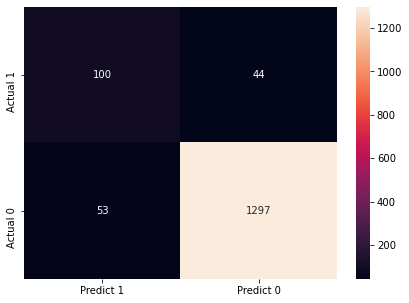

In [591]:
# calculate confusion matrix

print("Confusion Matrix")
cm=metrics.confusion_matrix(y_test, nb_test_predict, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["Actual 1","Actual 0"]],
                  columns = [i for i in ["Predict 1","Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True,fmt = 'd');

In [592]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, nb_test_predict, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.65      0.69      0.67       144
           0       0.97      0.96      0.96      1350

    accuracy                           0.94      1494
   macro avg       0.81      0.83      0.82      1494
weighted avg       0.94      0.94      0.94      1494



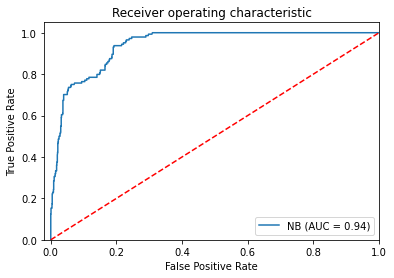

In [593]:
#plotting ROC and AUC
probs = nbb.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc_nb2 = metrics.auc(fpr, tpr)
plt.plot(fpr, tpr, label='NB (AUC = %0.2f)' % roc_auc_nb2)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('NB_ROC')
plt.show()

In [594]:
precision_nb2, recall_nb2, f1_score_nb2, support2 = precision_recall_fscore_support(y_test, nb_test_predict, average = 'macro')
print('Precision Score :', '%0.2f' % precision_nb2)
print('Recall Score :', '%0.2f' % recall_nb2)
print('F1-Score:', '%0.2f' % f1_score_nb2)
nb_acc2= accuracy_score(y_test, nb_test_predict)
print('Accuracy Score :','%0.2f' % nb_acc2)
print('AUC :','%0.2f' % roc_auc_nb2)

Precision Score : 0.81
Recall Score : 0.83
F1-Score: 0.82
Accuracy Score : 0.94
AUC : 0.94


# Comparision Result

In [598]:
modellists = []

modellists.append(['Logistic Regression',log_acc  * 100, recall_log * 100, precision_log * 100,roc_auc_log*100,f1_score_log * 100])

modellists.append(['Gaussian Naive Bayes 1 ', nb_acc * 100, recall_nb * 100, precision_nb * 100,roc_auc_nb*100,f1_score_nb * 100])

modellists.append(['Gaussian Naive Bayes 2', nb_acc2 * 100, recall_nb2 * 100, precision_nb2 * 100,roc_auc_nb2*100,f1_score_nb2 * 100])

model_df = pd.DataFrame(modellists, columns = ['Model', 'Accuracy Score', 'Recall Score', 'Precision Score','AUC','F1-Score'])

model_df.transpose()

,0,1,2
Model,Logistic Regression,Gaussian Naive Bayes 1,Gaussian Naive Bayes 2
Accuracy Score,94.37751,87.751004,93.507363
Recall Score,78.587963,75.541667,82.759259
Precision Score,86.504861,68.197711,81.039172
AUC,94.762346,91.820473,93.993056
F1-Score,81.928356,70.891983,81.86773


## Note:
### Gaussian Naive Bayes 1 is found without using discretization
### Gaussian Naive Bayes 2 is found with using discretization (Converting Numerical to categorical)

# Insights

## 1.Customers without a Credit Card provided by the bank, without a FDA, Securities Account and Mortgage are potential targets 
## 2.Customers having access to online banking are potential targets.
## 3.Age,Security,InternetBanking,Creditcard has negative impact towards logodds ratio of response

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Suggestion:

## 1. Data should include Family members,Income,Education to do better analysis
## 2. Data should include vehicle owned by customer